In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install --pre neuralprophet
!pip install --upgrade prophet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.4/145.4 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 34.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 48.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 829.5/829.5 kB 41.6 MB/s eta 0:00:00
  Attempting uninstall: holidays
    Found existing installation: holidays 0.24
    Uninstalling holidays-0.24:
      Successfully uninstalled holidays-0.24
  Attempting uninstall: pytorch-lightning
    Found existing installation: pytorch-lightning 2.2.1
    Uninstalling pytorch-lightning-2.2.1:
      Successfully uninstalled pytorch-lightning-2.2.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.4/14.4 MB 86.4 MB/s eta 0:00:00
  Attempting uninstall: prophet
    Found existing installation: prophet 1.1.1
    Uninstalling prophet-1.1.1:
      Successfully uninstalled prophet-1.1.1


In [3]:
df = pd.read_csv('/kaggle/input/ml-energy-forecasting/global-data-on-sustainable-energy.csv')

In [4]:
# create a copy of the dataframe for predicting power consumption
df_co2 = df.copy()

In [5]:
# drop 2 columns: Financial flows to developing countries (US $) and Renewables (% equivalent primary energy) have too many missing values (over 2000 missising values / total 3649 samples
df_co2.drop(['Financial flows to developing countries (US $)', 'Renewables (% equivalent primary energy)'], axis=1, inplace=True)

In [6]:
# drop the last 4 columns (in the columns array) as they are not relevant for predicting power consumption
df_co2.drop(df_co2.columns[-4:], axis=1, inplace=True)

In [7]:
# drop entity French Guiana as it has only 1 row
df_co2 = df_co2[df_co2['Entity'] != 'French Guiana']

In [8]:
# impute missing values by entity

def impute_missing_values_by_entity_first_step(df_fillna):
    df = df_fillna.copy()
    for entity in df['Entity'].unique():
        entity_df = df[df['Entity'] == entity]
        # fill all nan values in the beginning and final of all columns with interpolate linear, limit_direction both, limit_area outside
        entity_df = entity_df.interpolate(limit_direction='both', limit_area='outside')
        # fill all nan values in the middle of all columns with interpolate linear, limit_direction both, limit_area inside
        entity_df = entity_df.interpolate(limit_direction='both', limit_area='inside')
        df[df['Entity'] == entity] = entity_df
    df = df.reset_index(drop=True)
    return df

df_co2_filled_first_step = impute_missing_values_by_entity_first_step(df_co2)

In [9]:
# drop column 'Renewable-electricity-generating-capacity-per-capita', drop 11 entities with missing values in column 'Value_co2_emissions_kt_by_country'
df_co2_filled_first_step.drop('Renewable-electricity-generating-capacity-per-capita', axis=1, inplace=True)
df_co2_filled_first_step.dropna(subset=['Value_co2_emissions_kt_by_country'], inplace=True)

df_co2_filled_first_step.isna().sum()

Entity                                                                0
Year                                                                  0
Access to electricity (% of population)                               0
Access to clean fuels for cooking                                   147
Renewable energy share in the total final energy consumption (%)     21
Electricity from fossil fuels (TWh)                                  21
Electricity from nuclear (TWh)                                      126
Electricity from renewables (TWh)                                    21
Low-carbon electricity (% electricity)                               42
Primary energy consumption per capita (kWh/person)                    0
Energy intensity level of primary energy (MJ/$2017 PPP GDP)          21
Value_co2_emissions_kt_by_country                                     0
gdp_growth                                                           21
gdp_per_capita                                                  

In [10]:
# drop all rows with missing values
df_co2_filled_first_step.dropna(inplace=True)

In [11]:
df_co2_filled_first_step.isna().sum()

Entity                                                              0
Year                                                                0
Access to electricity (% of population)                             0
Access to clean fuels for cooking                                   0
Renewable energy share in the total final energy consumption (%)    0
Electricity from fossil fuels (TWh)                                 0
Electricity from nuclear (TWh)                                      0
Electricity from renewables (TWh)                                   0
Low-carbon electricity (% electricity)                              0
Primary energy consumption per capita (kWh/person)                  0
Energy intensity level of primary energy (MJ/$2017 PPP GDP)         0
Value_co2_emissions_kt_by_country                                   0
gdp_growth                                                          0
gdp_per_capita                                                      0
dtype: int64

In [12]:
df_co2_filled_first_step.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3081 entries, 0 to 3647
Data columns (total 14 columns):
 #   Column                                                            Non-Null Count  Dtype  
---  ------                                                            --------------  -----  
 0   Entity                                                            3081 non-null   object 
 1   Year                                                              3081 non-null   int64  
 2   Access to electricity (% of population)                           3081 non-null   float64
 3   Access to clean fuels for cooking                                 3081 non-null   float64
 4   Renewable energy share in the total final energy consumption (%)  3081 non-null   float64
 5   Electricity from fossil fuels (TWh)                               3081 non-null   float64
 6   Electricity from nuclear (TWh)                                    3081 non-null   float64
 7   Electricity from renewables (TWh)     

In [13]:
# for easy control, change name of column 'Value_co2_emissions_kt_by_country' to 'CO2', 'Access to electricity (% of population)' to 'AE',
# 'Access to clean fuels for cooking' to 'AF', 'Renewable energy share in the total final energy consumption (%)'to 'RE'
# 'Electricity from fossil fuels (TWh)' to 'EF',  'Electricity from nuclear (TWh)' to 'EN', 'Electricity from renewables (TWh)' to 'ER',
# Low-carbon electricity (% electricity) to 'EC',
# Primary energy consumption per capita (kWh/person) to 'PE', Energy intensity level of primary energy (MJ/$2017 PPP GDP) to 'EI', gdp_growth to 'GG', gdp_per_capita to 'GC'

df_co2_filled_first_step.rename(columns={'Value_co2_emissions_kt_by_country': 'CO2', 'Access to electricity (% of population)': 'AE', 'Access to clean fuels for cooking': 'AF',
                                'Renewable energy share in the total final energy consumption (%)': 'RE',
                                'Electricity from fossil fuels (TWh)': 'EF', 'Electricity from nuclear (TWh)': 'EN', 'Electricity from renewables (TWh)': 'ER',
                                'Low-carbon electricity (% electricity)': 'EC',
                                'Primary energy consumption per capita (kWh/person)': 'PE', 'Energy intensity level of primary energy (MJ/$2017 PPP GDP)': 'EI',
                                'gdp_growth': 'GG', 'gdp_per_capita': 'GC'}, inplace=True)

df_co2_filled_first_step.head()

,Entity,Year,AE,AF,RE,EF,EN,ER,EC,PE,EI,CO2,GG,GC
0,Afghanistan,2000,1.613591,6.2,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,8.832278,179.426579
1,Afghanistan,2001,4.074574,7.2,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,8.832278,179.426579
2,Afghanistan,2002,9.409158,8.2,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,8.832278,179.426579
3,Afghanistan,2003,14.738506,9.5,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,8.832278,190.683814
4,Afghanistan,2004,20.064968,10.9,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,1.414118,211.382074


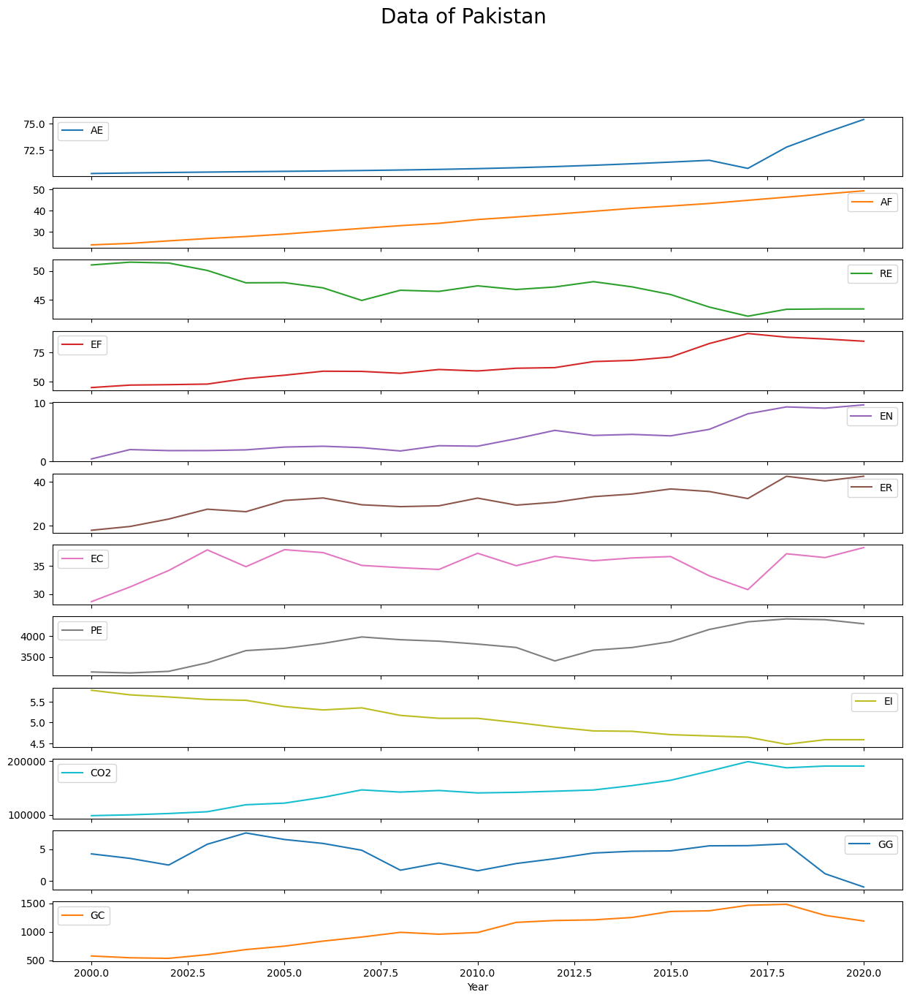

In [14]:
# choose 1 random entity and visualize the data of other columns for that entity
np.random.seed(42)
entity = np.random.choice(df_co2_filled_first_step['Entity'].unique())
entity_df = df_co2_filled_first_step[df_co2_filled_first_step['Entity'] == entity]
entity_df = entity_df.set_index('Year')
entity_df.drop('Entity', axis=1, inplace=True)
entity_df.plot(subplots=True, figsize=(15, 15))
plt.suptitle(f'Data of {entity}', fontsize=20)
plt.show()


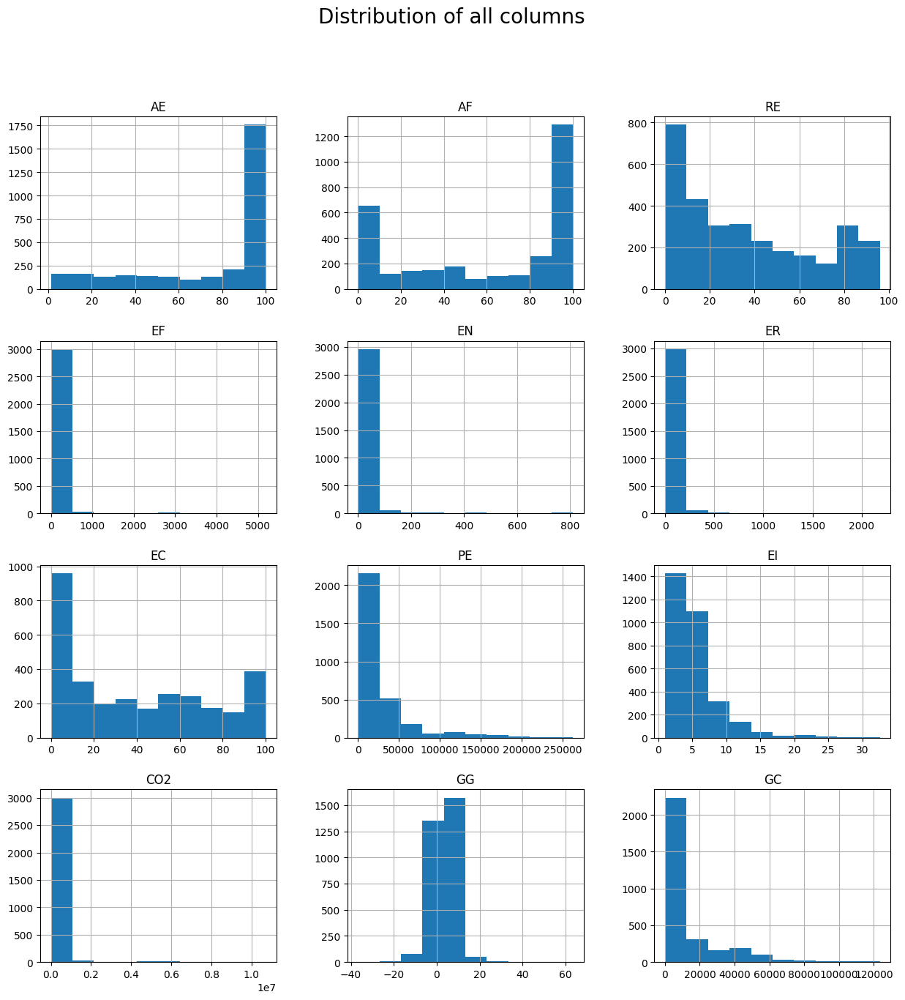

In [15]:
# visualize the distribution of all columns in the dataframe (except 'Year' and 'Entity')
df_co2_filled_first_step.drop(['Year', 'Entity'], axis=1).hist(figsize=(15, 15))
plt.suptitle('Distribution of all columns', fontsize=20)
plt.show()



In [16]:
# adf test for each entity, return a list of entities that are stationary in all columns
from statsmodels.tsa.stattools import adfuller

def adf_test(df_adf):
    stationary_entities = []
    stationary_co2 = []
    stationary_power = []
    for entity in df_adf['Entity'].unique():
        entity_df = df_adf[df_adf['Entity'] == entity]
        entity_df = entity_df.set_index('Year')
        entity_df.drop(['Entity'], axis=1, inplace=True)  
        cols = entity_df.columns
        for col in cols:
            if entity_df[col].nunique() < 4:
                entity_df.drop(col, axis=1, inplace=True)
        co2_col_idx = entity_df.columns.get_loc('CO2')
        power_col_idx = entity_df.columns.get_loc('PE')
        adf_result = entity_df.apply(lambda x: adfuller(x)[1])
        if all(adf_result < 0.05):
            stationary_entities.append(entity)
        if (adf_result[co2_col_idx] < 0.05):
            stationary_co2.append(entity)
        if (adf_result[power_col_idx] < 0.05):
            stationary_power.append(entity)
    return stationary_entities, stationary_co2, stationary_power
stationary_entities, stationary_co2, stationary_power = adf_test(df_co2_filled_first_step)
if len(stationary_entities) == 0:
    print('No entity is stationary in all columns')
else:
    print(stationary_entities)  
print("Number of entities have stationary CO2 column: ", len(stationary_co2), "over total entities: ", len(df_co2_filled_first_step['Entity'].unique()))
print("Number of entities have stationary Power column: ", len(stationary_power), "over total entities: ", len(df_co2_filled_first_step['Entity'].unique()))


No entity is stationary in all columns
Number of entities have stationary CO2 column:  23 over total entities:  148
Number of entities have stationary Power column:  25 over total entities:  148


In [17]:
def adf_test_after_differencing(df_adf):
    stationary_entities = []
    stationary_co2 = []
    stationary_power = []
    for entity in df_adf['Entity'].unique():
        entity_df = df_adf[df_adf['Entity'] == entity].copy()
        entity_df = entity_df.set_index('Year')
        entity_df.drop(['Entity'], axis=1, inplace=True)
        cols = entity_df.columns
        for col in cols:
            if entity_df[col].nunique() < 4:
                entity_df.drop(col, axis=1, inplace=True)
            else: 
                entity_df[col] = entity_df[col].diff()
        entity_df.dropna(inplace=True)
        co2_col_idx = entity_df.columns.get_loc('CO2')
        power_col_idx = entity_df.columns.get_loc('PE')
        adf_result = entity_df.apply(lambda x: adfuller(x)[1])
        if all(adf_result < 0.05):
            stationary_entities.append(entity)
        if (adf_result[co2_col_idx] < 0.05):
            stationary_co2.append(entity)
        if (adf_result[power_col_idx] < 0.05):
            stationary_power.append(entity)
    return stationary_entities, stationary_co2, stationary_power
stationary_entities, stationary_co2, stationary_power = adf_test_after_differencing(df_co2_filled_first_step)
if len(stationary_entities) == 0:
    print('No entity is stationary in all columns')
else:
    print(stationary_entities)  
print("Number of entities have stationary CO2 column: ", len(stationary_co2), "over total entities: ", len(df_co2_filled_first_step['Entity'].unique()))
print("Number of entities have stationary Power column: ", len(stationary_power), "over total entities: ", len(df_co2_filled_first_step['Entity'].unique()))


['South Sudan']
Number of entities have stationary CO2 column:  80 over total entities:  148
Number of entities have stationary Power column:  68 over total entities:  148


In [18]:
# data duplicate check
df_co2_filled_first_step.duplicated().sum()


0

In [19]:
df_co2_filled_first_step.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3081 entries, 0 to 3647
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Entity  3081 non-null   object 
 1   Year    3081 non-null   int64  
 2   AE      3081 non-null   float64
 3   AF      3081 non-null   float64
 4   RE      3081 non-null   float64
 5   EF      3081 non-null   float64
 6   EN      3081 non-null   float64
 7   ER      3081 non-null   float64
 8   EC      3081 non-null   float64
 9   PE      3081 non-null   float64
 10  EI      3081 non-null   float64
 11  CO2     3081 non-null   float64
 12  GG      3081 non-null   float64
 13  GC      3081 non-null   float64
dtypes: float64(12), int64(1), object(1)
memory usage: 361.1+ KB


In [20]:
from prophet import Prophet
def prophet_predict_for_each_entity(df):
    entities = df['Entity'].unique()
    true = []
    predict = []
    predict_unseen = []
    for entity in entities:
        entity_df = df[df['Entity'] == entity].copy()
        entity_df.drop('Entity', axis=1, inplace=True)
        entity_df.drop(entity_df.columns.difference(['Year', 'CO2']), axis=1, inplace=True)
        entity_df.rename(columns={'Year': 'ds', 'CO2': 'y'}, inplace=True)
        entity_df['ds'] = pd.to_datetime(entity_df['ds'], format='%Y')
        entity_df = entity_df.reset_index(drop=True)
        entity_df.set_index('ds', inplace=True)
        train = entity_df.iloc[:-5]
        test = entity_df.iloc[-5:]
        model = Prophet()
        model.fit(train.reset_index().rename(columns={'ds': 'ds', 'y': 'y'}))
        future = model.make_future_dataframe(periods=10, freq='Y', include_history=True)
        forecast = model.predict(future)
        predict_unseen.append(forecast['yhat'].iloc[-5:].values)
        predict.append(forecast['yhat'].iloc[-10:-5].values)
        true.append(test['y'].values)
#         break
    return predict, predict_unseen, true

In [21]:
# calculate the predict and predict unseen for all entities
predict, predict_unseen, true = prophet_predict_for_each_entity(df_co2_filled_first_step)


11:05:33 - cmdstanpy - INFO - Chain [1] start processing
11:05:34 - cmdstanpy - INFO - Chain [1] done processing
11:05:34 - cmdstanpy - INFO - Chain [1] start processing
11:05:34 - cmdstanpy - INFO - Chain [1] done processing
11:05:34 - cmdstanpy - INFO - Chain [1] start processing
11:05:34 - cmdstanpy - INFO - Chain [1] done processing
11:05:34 - cmdstanpy - INFO - Chain [1] start processing
11:05:34 - cmdstanpy - INFO - Chain [1] done processing
11:05:34 - cmdstanpy - INFO - Chain [1] start processing
11:05:34 - cmdstanpy - INFO - Chain [1] done processing
11:05:34 - cmdstanpy - INFO - Chain [1] start processing
11:05:34 - cmdstanpy - INFO - Chain [1] done processing
11:05:35 - cmdstanpy - INFO - Chain [1] start processing
11:05:35 - cmdstanpy - INFO - Chain [1] done processing
11:05:35 - cmdstanpy - INFO - Chain [1] start processing
11:05:35 - cmdstanpy - INFO - Chain [1] done processing
11:05:35 - cmdstanpy - INFO - Chain [1] start processing
11:05:35 - cmdstanpy - INFO - Chain [1]

In [22]:
len(predict_unseen)

148

In [23]:
predict_df = pd.DataFrame(predict, columns=[f'Year_{i}' for i in range(1, 6)])
predict_unseen_df = pd.DataFrame(predict_unseen, columns=[f'Year_{i}' for i in range(6, 11)])
true_df = pd.DataFrame(true, columns=[f'Year_{i}' for i in range(1, 6)])

In [24]:
predict_df

,Year_1,Year_2,Year_3,Year_4,Year_5
0,9295.608822,9048.738805,9794.186194,10551.995761,11321.833449
1,181264.435277,176726.217890,188365.293517,200908.870199,214350.634772
2,29237.778517,30474.002787,31462.559840,32411.670270,33321.483740
3,508.427780,575.982716,568.399937,568.474107,576.208868
4,241787.833235,211326.054770,225239.580146,241470.469696,259999.157807
...,...,...,...,...,...
143,11416.645575,9083.465377,9965.500962,11007.830716,12209.079943
144,99213.723191,107059.862353,103600.104513,99220.357038,93926.300119
145,131.828808,147.446034,149.340259,150.279014,150.268659
146,4675.623027,4731.639317,4970.206965,5220.383692,5482.084304


In [25]:
predict_df.iloc[:, 0]

0        9295.608822
1      181264.435277
2       29237.778517
3         508.427780
4      241787.833235
           ...      
143     11416.645575
144     99213.723191
145       131.828808
146      4675.623027
147      9695.994354
Name: Year_1, Length: 148, dtype: float64

In [26]:
# there are 5 mae, mae_1, mae_2, mae_3, mae_4, mae_5, mae_1 = mae(predict[:][0],true[:][0])
from sklearn.metrics import mean_absolute_error, mean_squared_error

def calculate_error(predict_df, true_df):
    mae = []
    rmse = []
    for i in range(len(predict_df.columns)):
        mae.append(mean_absolute_error(true_df.iloc[:, i], predict_df.iloc[:, i]))
        rmse.append(np.sqrt(mean_squared_error(true_df.iloc[:, i], predict_df.iloc[:, i])))
    return mae, rmse

mae, rmse = calculate_error(predict_df, true_df)

In [27]:
rmse

[194147.26906797788,
 117815.31943752232,
 143072.4093064676,
 188056.19304528262,
 259814.89942388915]

In [28]:
mae

[29374.43488530667,
 16676.583360366094,
 22589.99304314358,
 29688.658766975892,
 40125.900258526184]

In [29]:
# # plot the predict and the true with the true is 8 last record data in entity_df and the predict is the last 5 years in forecast

def visualize_predict_prophet(df, predict_df, predict_unseen_df, entity_idx):
    entity_name = df['Entity'].unique()[entity_idx]
    entity_df = df[df['Entity'] == entity_name].copy()
    year_unseen = [i for i in range(2020, 2026)]
    prediction = np.concatenate((predict_df.loc[entity_idx].values, predict_unseen_df.loc[entity_idx].values))
    plt.figure(figsize=(15, 8))
    plt.plot(entity_df['Year'].values[-8:], entity_df['CO2'].values[-8:], label='True')
    plt.plot(entity_df['Year'].values[-5:], predict_df.loc[entity_idx].values, label='Predict test')
    plt.plot(year_unseen, prediction[-6:], label='Predict unseen')
    plt.title(f'Predict CO2 emission of {entity_name}', fontsize=20)
    plt.xlabel('Year')
    plt.ylabel('CO2 emissions')
    plt.axvline(entity_df['Year'].values[-5], color='r', linestyle='--')
    plt.axvline(entity_df['Year'].values[-1], color='r', linestyle='--')
    plt.legend()
    plt.show()

# visualize_predict_prophet(df_co2_filled_first_step, predict_df, predict_unseen_df, 100)



In [30]:
def prophet_predict_for_each_entity_with_lags(df):
    entities = df['Entity'].unique()
    true = []
    predict = []
    predict_unseen = []
    list_regressors = ['AE', 'AF', 'RE', 'EF', 'EN', 'ER', 'EC', 'EI','PE', 'GG', 'GC']
    for entity in entities:
        entity_df = df[df['Entity'] == entity].copy()
        entity_df.drop('Entity', axis=1, inplace=True)
        # add 5 rows with year 2021, 2022, 2023, 2024, 2025 to entity_df, all columns are nan
        new_rows = pd.DataFrame({'Year': [2021, 2022, 2023, 2024, 2025]})
        new_rows = new_rows.assign(**{col: np.nan for col in entity_df.columns[1:]})

        # Thêm DataFrame mới vào cuối entity_df
        entity_df = pd.concat([entity_df, new_rows], ignore_index=True)

        for regressor in list_regressors:
            regressor_data = entity_df.drop(entity_df.columns.difference(['Year', regressor]), axis=1)
            regressor_data.rename(columns={'Year': 'ds', regressor: 'y'}, inplace=True)
            regressor_data['ds'] = pd.to_datetime(regressor_data['ds'], format='%Y')
            regressor_data = regressor_data.reset_index(drop=True)
            regressor_data.set_index('ds', inplace=True)
            train = regressor_data.iloc[:-5]
            regressor_model = Prophet()
            regressor_model.fit(train.reset_index().rename(columns={'ds': 'ds', regressor: 'y'}))
            regressor_future = regressor_model.make_future_dataframe(periods=5, freq='Y', include_history=False)
            regressor_forecast = regressor_model.predict(regressor_future)
            regressor_unseen = regressor_forecast['yhat'].values
            # add regressor_unseen to entity_df[resgressor] at year 2021, 2022, 2023, 2024, 2025
            entity_df.loc[entity_df['Year'] == 2021, regressor] = regressor_unseen[0]
            entity_df.loc[entity_df['Year'] == 2022, regressor] = regressor_unseen[1]
            entity_df.loc[entity_df['Year'] == 2023, regressor] = regressor_unseen[2]
            entity_df.loc[entity_df['Year'] == 2024, regressor] = regressor_unseen[3]
            entity_df.loc[entity_df['Year'] == 2025, regressor] = regressor_unseen[4]

        pe_df = entity_df.copy()
        pe_df.rename(columns={'Year': 'ds', 'CO2': 'y'}, inplace=True)
        pe_df['ds'] = pd.to_datetime(pe_df['ds'], format='%Y')
        pe_df = pe_df.reset_index(drop=True)
        pe_df.set_index('ds', inplace=True)
        pe_df.dropna(inplace=True)
        train_pe = pe_df.iloc[:-5]
        test_pe = pe_df.iloc[-5:]
        model_pe = Prophet()
        # add regressors to model_pe
        for regressor in list_regressors:
            model_pe.add_regressor(regressor)

        model_pe.fit(train_pe.reset_index().rename(columns={'ds': 'ds', 'y': 'y'}))
        future_pe = model_pe.make_future_dataframe(periods=10, freq='Y', include_history=True)
        for regressor in list_regressors:
            future_pe[regressor] = entity_df[regressor].values
        forecast_pe = model_pe.predict(future_pe)
        predict_unseen.append(forecast_pe['yhat'].iloc[-5:].values)
        predict.append(forecast_pe['yhat'].iloc[-10:-5].values)
        true.append(test_pe['y'].values)
#         break
    return predict, predict_unseen, true
            
        

        

            


In [31]:
# calculate the predict and predict unseen for all entities
predict_lags, predict_unseen_lags, true = prophet_predict_for_each_entity_with_lags(df_co2_filled_first_step)

11:06:00 - cmdstanpy - INFO - Chain [1] start processing
11:06:00 - cmdstanpy - INFO - Chain [1] done processing
11:06:00 - cmdstanpy - INFO - Chain [1] start processing
11:06:00 - cmdstanpy - INFO - Chain [1] done processing
11:06:00 - cmdstanpy - INFO - Chain [1] start processing
11:06:00 - cmdstanpy - INFO - Chain [1] done processing
11:06:00 - cmdstanpy - INFO - Chain [1] start processing
11:06:00 - cmdstanpy - INFO - Chain [1] done processing
11:06:01 - cmdstanpy - INFO - Chain [1] start processing
11:06:01 - cmdstanpy - INFO - Chain [1] done processing
11:06:01 - cmdstanpy - INFO - Chain [1] start processing
11:06:01 - cmdstanpy - INFO - Chain [1] done processing
11:06:01 - cmdstanpy - INFO - Chain [1] start processing
11:06:01 - cmdstanpy - INFO - Chain [1] done processing
11:06:01 - cmdstanpy - INFO - Chain [1] start processing
11:06:01 - cmdstanpy - INFO - Chain [1] done processing
11:06:01 - cmdstanpy - INFO - Chain [1] start processing
11:06:01 - cmdstanpy - INFO - Chain [1]

In [32]:
# calculate the error
predict_lags_df = pd.DataFrame(predict_lags, columns=[f'Year_{i}' for i in range(1, 6)])
predict_unseen_lags_df = pd.DataFrame(predict_unseen_lags, columns=[f'Year_{i}' for i in range(6, 11)])
true_df = pd.DataFrame(true, columns=[f'Year_{i}' for i in range(1, 6)])
mae_lags, rmse_lags = calculate_error(predict_lags_df, true_df)




In [33]:
mae_lags

[25110.235842145015,
 15936.941721234587,
 22268.856445577334,
 38240.800786976986,
 62219.83143038932]

In [34]:
rmse_lags

[108983.58956491297,
 69614.97956453294,
 110210.41045801416,
 202148.1237032905,
 316309.8050743298]

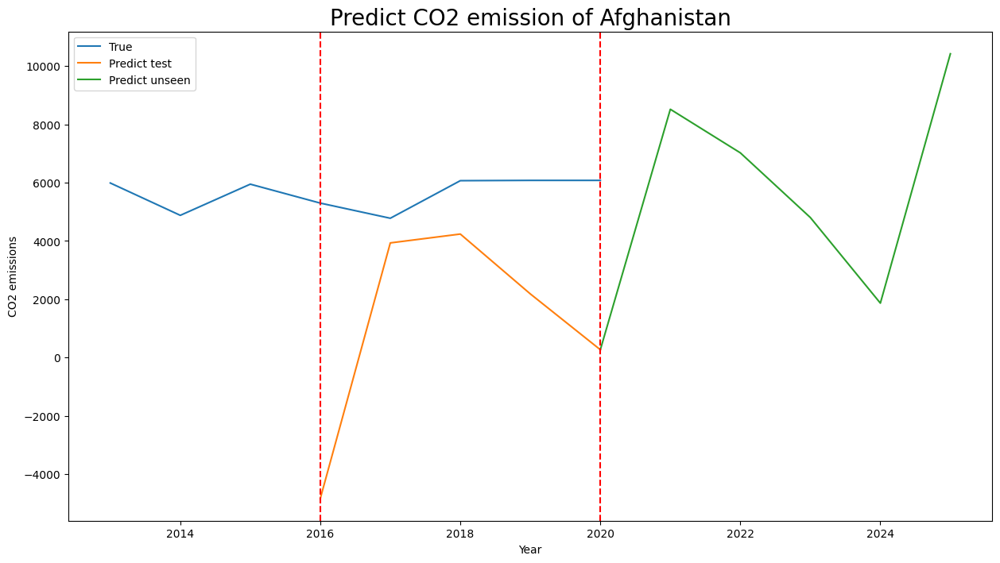

In [35]:
# visualize the predict and the true with the true is 8 last record data in entity_df and the predict is the last 5 years in forecast
visualize_predict_prophet(df_co2_filled_first_step, predict_lags_df, predict_unseen_lags_df, 0)

In [36]:
# Import the NeuralProphet class
from neuralprophet import NeuralProphet, set_log_level

# Disable logging messages unless there is an error
set_log_level("ERROR")
import pickle

In [37]:
# drop entity French Guiana as it has only 1 row
df_co2_filled_first_step_neural = df_co2_filled_first_step[df_co2_filled_first_step['Entity'] != 'South Sudan']
df_co2_filled_first_step_neural = df_co2_filled_first_step_neural[df_co2_filled_first_step_neural['Entity'] != 'Serbia']
df_co2_filled_first_step_neural = df_co2_filled_first_step_neural[df_co2_filled_first_step_neural['Entity'] != 'Montenegro']

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

2024-04-18 11:16:38.344105: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-18 11:16:38.344215: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-18 11:16:38.494789: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

MAE NeuralProphet:  [43707.24815099388, 43050.34059213463, 39129.90395553761, 33885.96771648855, 27788.442794977545]
RMSE NeuralProphet:  [265477.9225249818, 259015.68940157318, 249344.09919919702, 198452.1943031518, 137643.2271920695]


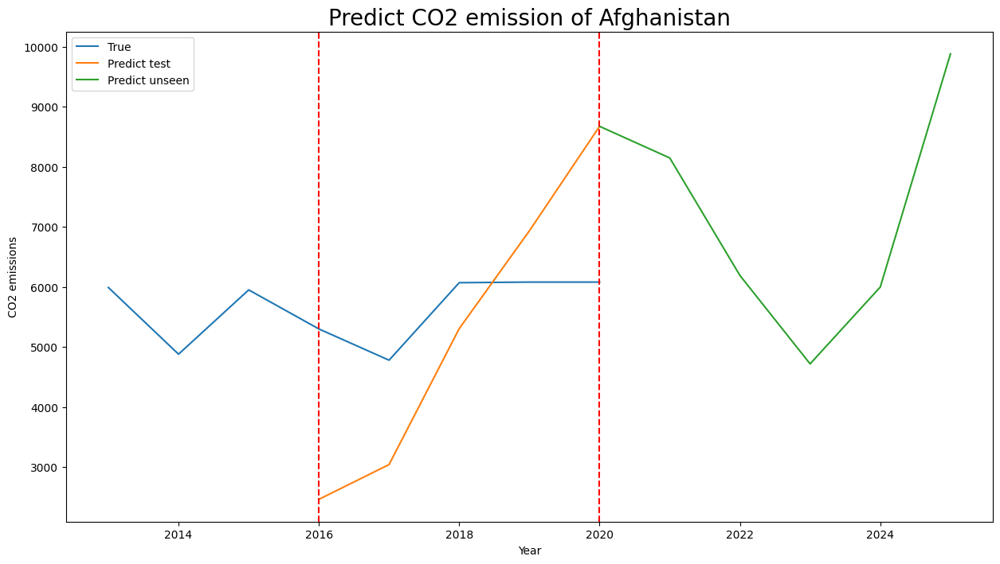

In [38]:
def neural_prophet_predict_for_each_entity(df):
    entities = df['Entity'].unique()
    true = []
    predict = []
    predict_unseen = []
    for entity in entities:
        entity_df = df[df['Entity'] == entity].copy()
        entity_df.drop('Entity', axis=1, inplace=True)
        entity_df.drop(entity_df.columns.difference(['Year', 'CO2']), axis=1, inplace=True)
        entity_df.rename(columns={'Year': 'ds', 'CO2': 'y'}, inplace=True)
        entity_df['ds'] = pd.to_datetime(entity_df['ds'], format='%Y')
        entity_df = entity_df.reset_index(drop=True)
        # entity_df.set_index('ds', inplace=True)
        train = entity_df.iloc[:-5]
        test = entity_df.iloc[-5:]
        model = NeuralProphet(
                yearly_seasonality=False,
                weekly_seasonality=False,
                daily_seasonality=False,
                n_lags=3)
        model.fit(train, freq='Y')
        future = model.make_future_dataframe(train, periods=10, n_historic_predictions=len(train))
        forecast = model.predict(future)
        predict_unseen.append(forecast['yhat1'].iloc[-5:].values)
        predict.append(forecast['yhat1'].iloc[-10:-5].values)
        true.append(test['y'].values)
#         break
    return predict, predict_unseen, true

# calculate the predict and predict unseen for all entities
predict_neural, predict_unseen_neural, true = neural_prophet_predict_for_each_entity(df_co2_filled_first_step_neural)

# calculate the error
predict_neural_df = pd.DataFrame(predict_neural, columns=[f'Year_{i}' for i in range(1, 6)])
predict_unseen_neural_df = pd.DataFrame(predict_unseen_neural, columns=[f'Year_{i}' for i in range(6, 11)])
true_neural_df = pd.DataFrame(true, columns=[f'Year_{i}' for i in range(1, 6)])
mae_neural, rmse_neural = calculate_error(predict_neural_df, true_neural_df)

print('MAE NeuralProphet: ', mae_neural)
print('RMSE NeuralProphet: ', rmse_neural)

# visualize the predict and the true with the true is 8 last record data in entity_df and the predict is the last 5 years in forecast
visualize_predict_prophet(df_co2_filled_first_step, predict_neural_df, predict_unseen_neural_df, 0)

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
2
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
3
EF
2
EN
1
ER
2
EC
2
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
3
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
1
EF
4
EN
1
ER
2
EC
3
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
2
EC
3
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
4
RE
4
EF
4
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
3
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
1
RE
4
EF
4
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
1
EN
1
ER
4
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
3
AF
3
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
1
RE
4
EF
3
EN
1
ER
2
EC
3
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
1
RE
4
EF
2
EN
1
ER
3
EC
2
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
3
AF
4
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
1
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
1
EC
1
EI
4
PE
4
GG
2
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
3
EN
1
ER
3
EC
3
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
3
RE
4
EF
3
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
3
RE
3
EF
3
EN
1
ER
1
EC
1
EI
4
PE
4
GG
1
GC
1


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
1
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
3
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
1
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
3
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
1
RE
4
EF
2
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
3
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
3
RE
4
EF
4
EN
1
ER
4
EC
4
EI
3
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
1
EN
1
ER
4
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
3
EN
1
ER
3
EC
3
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
1
RE
4
EF
4
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
1
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
2
EF
4
EN
1
ER
2
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
1
EN
1
ER
4
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
2
RE
4
EF
2
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
1
EN
1
ER
2
EC
2
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
3
EF
4
EN
1
ER
2
EC
3
EI
3
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
2
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
3
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
3
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
3
EN
1
ER
4
EC
4
EI
3
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
1
RE
4
EF
2
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
3
EN
1
ER
4
EC
3
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
3
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
3
EN
1
ER
1
EC
3
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
3
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
1
EF
4
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
3
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
3
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
2
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
3
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
2
EF
4
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
4
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
3
EN
1
ER
2
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
3
EN
1
ER
1
EC
3
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
3
AF
1
RE
4
EF
4
EN
1
ER
2
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
2
RE
4
EF
3
EN
1
ER
4
EC
3
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
2
RE
4
EF
2
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
2
EN
1
ER
1
EC
1
EI
4
PE
4
GG
2
GC
3


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
3
AF
4
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
3
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
1
EN
1
ER
1
EC
1
EI
3
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
3
EF
4
EN
1
ER
2
EC
2
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
2
RE
4
EF
4
EN
1
ER
4
EC
4
EI
3
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
1
RE
2
EF
4
EN
1
ER
1
EC
1
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
2
RE
4
EF
3
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
2
AF
3
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
3
EF
4
EN
1
ER
3
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
1
AF
1
RE
4
EF
4
EN
4
ER
4
EC
4
EI
3
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
1
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
3
AF
3
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
1
EN
1
ER
2
EC
2
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
4
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

AE
4
AF
2
RE
4
EF
4
EN
1
ER
4
EC
4
EI
4
PE
4
GG
4
GC
4


Finding best initial lr:   0%|          | 0/201 [00:00<?, ?it/s]

Training: 0it [00:00, ?it/s]

Predicting: 2it [00:00, ?it/s]

MAE NeuralProphet with lags:  [41434.00407956941, 41916.26611129653, 37451.19618093057, 35091.310722965885, 30508.1210120587]
RMSE NeuralProphet with lags:  [238786.86111050725, 256363.62602199352, 240099.52238475604, 198670.90024676104, 166775.23070341867]


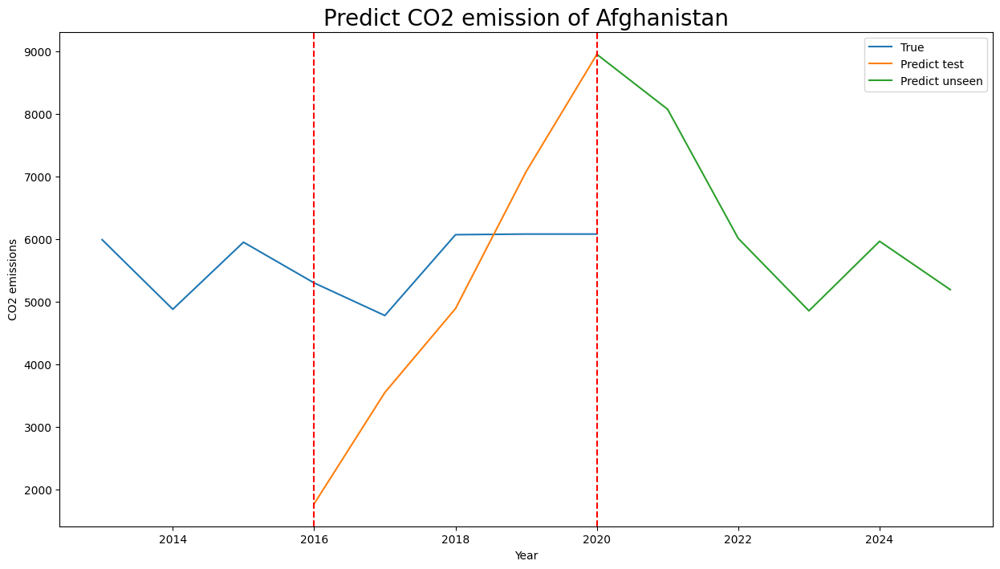

In [39]:
def neural_prophet_predict_for_each_entity_with_lags(df):
    entities = df['Entity'].unique()
    true = []
    predict = []
    predict_unseen = []
    
    for entity in entities:
        regressors = ['AE', 'AF', 'RE', 'EF', 'EN', 'ER', 'EC', 'EI', 'PE', 'GG', 'GC']
        removed_regressors = []
        entity_df = df[df['Entity'] == entity].copy()
        entity_df.drop('Entity', axis=1, inplace=True)
        entity_df.rename(columns={'Year': 'ds', 'CO2': 'y'}, inplace=True)
        entity_df['ds'] = pd.to_datetime(entity_df['ds'], format='%Y')
        # check if any column in regressors has value does not change, drop that column and drop from regressors
        for regressor in regressors:
            print(regressor)
            print(entity_df.iloc[-9:-5][regressor].nunique())
            if entity_df.iloc[-9:-5][regressor].nunique() < 3:
                entity_df.drop(regressor, axis=1, inplace=True)
                removed_regressors.append(regressor)
        for regressor in removed_regressors:
            regressors.remove(regressor)
        entity_df = entity_df.reset_index(drop=True)
        train = entity_df.iloc[:-5]
        test = entity_df.iloc[-5:]
        model = NeuralProphet(
                yearly_seasonality=False,
                weekly_seasonality=False,
                daily_seasonality=False,
                n_lags=3)
        for regressor in regressors:
            model.add_lagged_regressor(regressor, n_lags = 3)
        model.fit(train, freq='Y')
        future = model.make_future_dataframe(train, periods=10, n_historic_predictions=True)
        forecast = model.predict(future)
        predict_unseen.append(forecast['yhat1'].iloc[-5:].values)
        predict.append(forecast['yhat1'].iloc[-10:-5].values)
        true.append(test['y'].values)
    return predict, predict_unseen, true

# calculate the predict and predict unseen for all entities
predict_neural_lags, predict_unseen_neural_lags, true = neural_prophet_predict_for_each_entity_with_lags(df_co2_filled_first_step_neural)

# calculate the error
predict_neural_lags_df = pd.DataFrame(predict_neural_lags, columns=[f'Year_{i}' for i in range(1, 6)])

predict_unseen_neural_lags_df = pd.DataFrame(predict_unseen_neural_lags, columns=[f'Year_{i}' for i in range(6, 11)])

true_neural_df = pd.DataFrame(true, columns=[f'Year_{i}' for i in range(1, 6)])

mae_neural_lags, rmse_neural_lags = calculate_error(predict_neural_lags_df, true_neural_df)

print('MAE NeuralProphet with lags: ', mae_neural_lags)
print('RMSE NeuralProphet with lags: ', rmse_neural_lags)

# visualize the predict and the true with the true is 8 last record data in entity_df and the predict is the last 5 years in forecast
visualize_predict_prophet(df_co2_filled_first_step_neural, predict_neural_lags_df, predict_unseen_neural_lags_df, 0)

        
        

In [40]:
# save results: predict and predict_unseen to csv file
predict_df.to_csv('predict_prophet.csv', index=False)
predict_unseen_df.to_csv('predict_unseen_prophet.csv', index=False)
predict_lags_df.to_csv('predict_prophet_with_lags.csv', index=False)
predict_unseen_lags_df.to_csv('predict_unseen_prophet_with_lags.csv', index=False)
predict_neural_df.to_csv('predict_neural.csv', index=False)
predict_unseen_neural_df.to_csv('predict_unseen_neural.csv', index=False)
predict_neural_lags_df.to_csv('predict_neural_with_lags.csv', index=False)
predict_unseen_neural_lags_df.to_csv('predict_unseen_neural_with_lags.csv', index=False)
true_df.to_csv('true.csv', index=False)
true_neural_df.to_csv('true_neural.csv', index=False)